# Plots

Objectives
 * Understand how to limit the amount of data needed for a plot
 * Use Matplotlib to make simple plots of data fetched from HSDS

In [1]:
%matplotlib inline
import h5pyd as h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.animation as animation

In [2]:
filename = '/shared/sample/blue_marble.h5'
fin = h5py.File(filename, 'r')

In [3]:
fin.id.id

'g-e0cd49c7-a8b402af-6845-c14f20-3c8a27'

In [4]:
image = fin["image"]
image.id.id

'd-e0cd49c7-a8b402af-7dce-b7e08d-7eecb2'

In [5]:
image.shape

(8000, 8000, 3)

In [6]:
# with a (500,1000,3) chunk shape, there are 128 chunks for this dataset (1.5MB each)
image.chunks

(500, 1000, 3)

In [7]:
# Get every 8th point so we have a 1000x1000 pixel image
%time arr = image[::8,::8,...]

CPU times: user 26.3 ms, sys: 16.7 ms, total: 43 ms
Wall time: 2.07 s


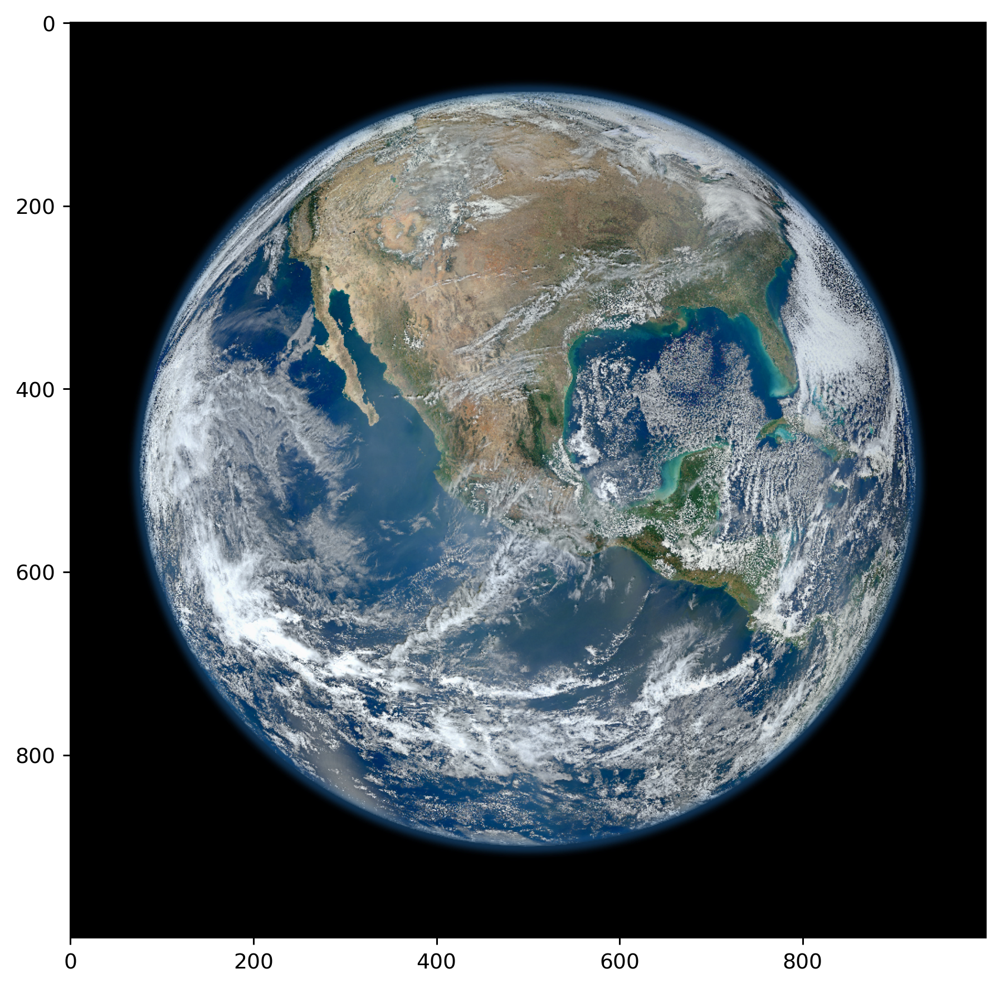

In [8]:
plt.figure(1, figsize=(8,8),dpi=272)
plt.imshow(arr)

In [9]:
# Get a 1000x1000 sub-image, this time at full resolution
%time subarr = image[1500:2500,1500:2500,::]

CPU times: user 27.6 ms, sys: 8.41 ms, total: 36 ms
Wall time: 67.3 ms


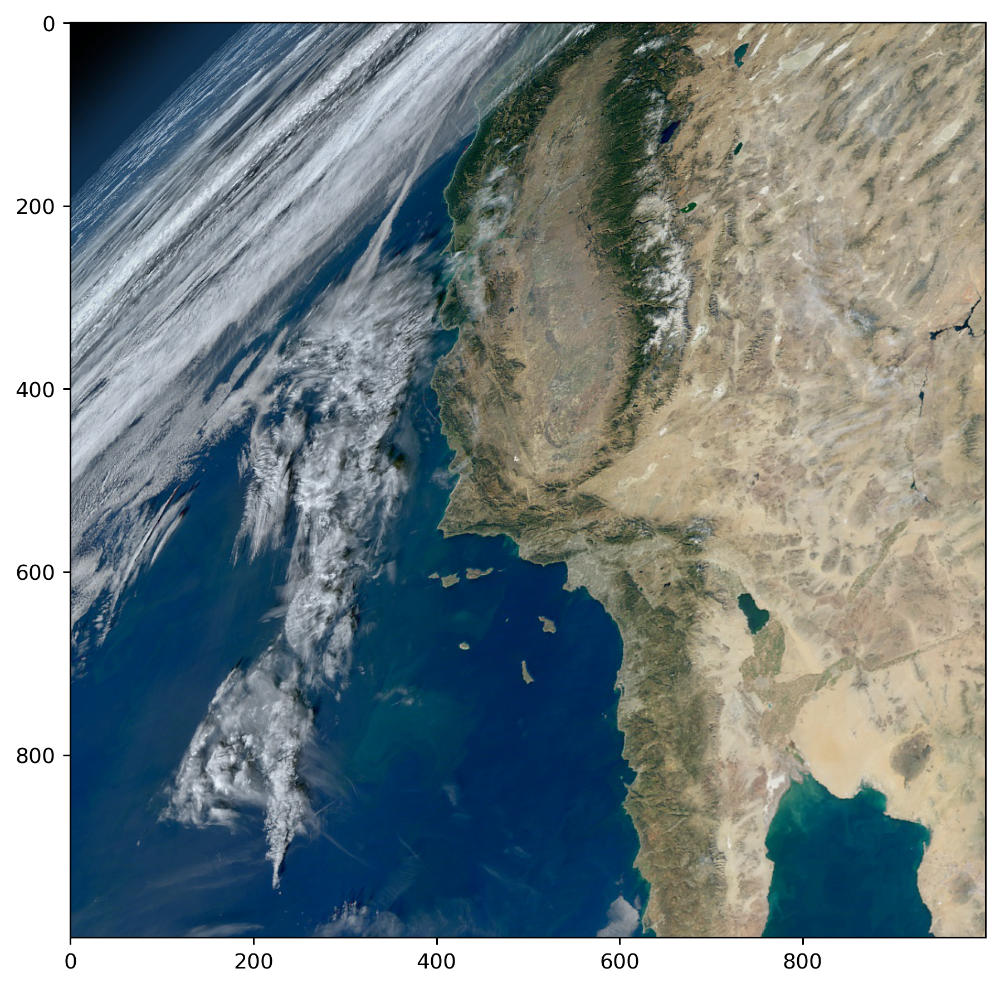

In [10]:
plt.figure(1, figsize=(8,8),dpi=272)
plt.imshow(subarr)

# XYPlots

In [11]:
# open file from NREL "National Solar Regional Database" NSRDB
# The bucket parameter is used because this isn't stored on HDFLab's storage
filepath = "/nrel/nsrdb/v3/nsrdb_2000.h5"
f = h5py.File(filepath, bucket="nrel-pds-hsds")

In [12]:
# get the 'wind_speed' dataset
dset = f['wind_speed']
dset

<HDF5 dataset "wind_speed": shape (17568, 2018392), type "<i2">

In [13]:
# read a random column from the dataset
%time arr = dset[:, 7678]

CPU times: user 7.8 ms, sys: 0 ns, total: 7.8 ms
Wall time: 1.14 s


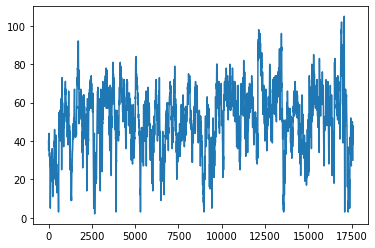

In [14]:
# plot array indices against data values
x = range(len(arr))
plt.plot(x, arr)